In [1]:
import matplotlib.pyplot as plt
from tifffile import imread
import pandas as pd
import numpy as np 
# from laptrack import LapTrack
# from skimage.measure import regionprops_table
# from skimage.transform import resize
# from stardist.models import StarDist2D
import os
import seaborn as sns 
# from csbdeep.utils import normalize
import sys

In [2]:
sys.path.insert(0, os.path.abspath('../spt/notebook/'))

import utils as ut

2023-05-23 14:36:21.770652: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Notebook to test the single particle analysis workflow

Steps: 
- Load the image 
- Split the 2 channels
- Run hmax on the cohesin channel
- Run hmax on the DNA channel
- Run the stardist on the DNA channel
- Assign spots (TetO,Cohesin) to a cell
- Filter the cells based on the area
- Motion correction
- Analysis 

## Load the image

Load only a small crop on an image to speed the analysis.

I will use the images: 20220907_Rad21-Halo_SPT_2D5_Sororin_noaux_40mW_2(_w1/2)

Crop : x:(0;322) y:(253;512)

The images are of shape (t,z,y,x)

In [3]:
im_w1 = imread('20220907_Rad21-Halo_SPT_2D5_Sororin_noaux_40mW_2_w1.tif')
im_w2 = imread('20220907_Rad21-Halo_SPT_2D5_Sororin_noaux_40mW_2_w2.tif')
print(f'The images are of shape: w1:{np.shape(im_w1)} and w2:{np.shape(im_w2)}')

The images are of shape: w1:(181, 5, 512, 512) and w2:(181, 5, 512, 512)


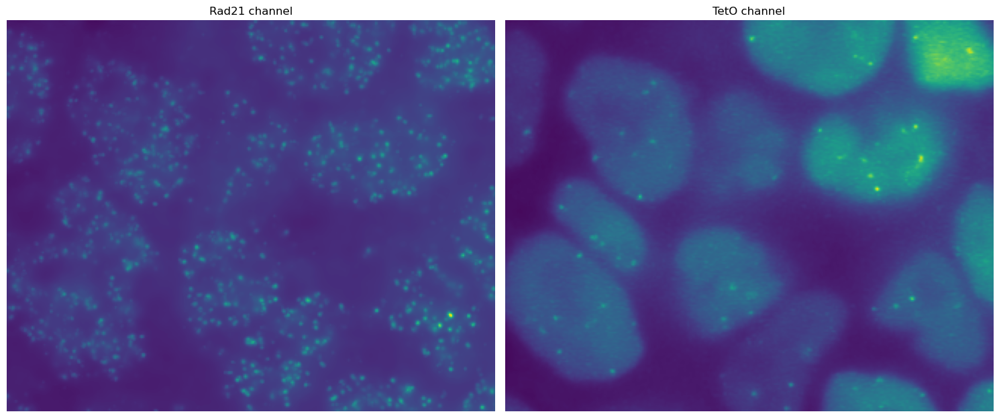

In [4]:
fig,ax = plt.subplots(1,2,figsize=(15,10))
frame =  100
ax[0].imshow(np.max(im_w1,axis=1)[frame,...])
ax[1].imshow(np.max(im_w2,axis=1)[frame,...])

title = ['Rad21 channel','TetO channel']

xmin,xmax,ymin,ymax = 0,323,253,512
for l,a in enumerate(ax):
    a.set_title(title[l])
    a.axis('off')
    a.set_xlim(xmin,xmax)
    a.set_ylim(ymin,ymax)

plt.tight_layout()

# Run hmax on TetO and Sororin

In [5]:
# TO DO

## Fix the detection when the images has different size in x and y

In [6]:
im_w1_sd_p = np.std(im_w1,axis=1)
im_w1_max_p = np.max(im_w1,axis=1)
im_w2_sd_p = np.std(im_w2,axis=1)
im_w2_max_p = np.max(im_w2,axis=1)

In [7]:
frame = 100

In [8]:
sd_sororin = ut.compute_h_param(im=im_w1_sd_p,frame=frame)
sd_teto = ut.compute_h_param(im=im_w2_sd_p,frame=frame)

fromnumeric.py (3432): Mean of empty slice.
_methods.py (190): invalid value encountered in double_scalars
fromnumeric.py (3432): Mean of empty slice.
_methods.py (190): invalid value encountered in double_scalars


In [9]:
from skimage.morphology import extrema
def hmax_detection(raw_im:np.array,frame:int,sd:float,n:int = 2,thresh:float = 0.5) -> pd.DataFrame:
    """_summary_

    Args:
        raw_im (np.array): the raw image to segment
        frame (int): the frame to segment
        sd (float): the sd of the peak intensity (threshold of segmentation)
        n (int, optional): how much brighter than the sd of the whole image to threshold
        thresh (float, optional): threshold for the gaussian fitting filter. Filter on the standard deviation of the fit (based on the covariance of the parameters) Defaults to 0.5.

    Returns:
        pd.DataFrame: Dataframe of sub-pixel localizations of the detected spots
    """
    
    #detect the spots
    im_mask = extrema.h_maxima(raw_im[frame],n*int(sd))

    # extract the points and fit gaussian

    y,x = np.nonzero(im_mask)  # coordinates of every ones

    x_s = []
    y_s = []
    sdx_fit = []
    sdy_fit = []

    for i,j in zip (x,y):
        y0,x0,sd_x,sd_y = gauss_single_spot(raw_im[frame],r_coord=j,c_coord=i)
        x_s.append(x0)
        y_s.append(y0)
        sdx_fit.append(sd_x)
        sdy_fit.append(sd_y)
        
    # create a dataframe with sub pixel localization

    df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
    df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
    df_loc['frame'] = [frame] * len(df_loc)
    df_loc
    
    # filter the dataframe based on the gaussian fit

    df_loc_filtered = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
    df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
    df_loc_filtered

    return df_loc_filtered

In [9]:
df_detection_sororin = ut.hmax_3D(raw_im=im_w1,frame=frame,sd=sd_sororin)
df_detection_teto = ut.hmax_3D(raw_im=im_w2,frame=frame,sd=sd_teto,n=9,thresh=0.25)

(253.0, 512.0)

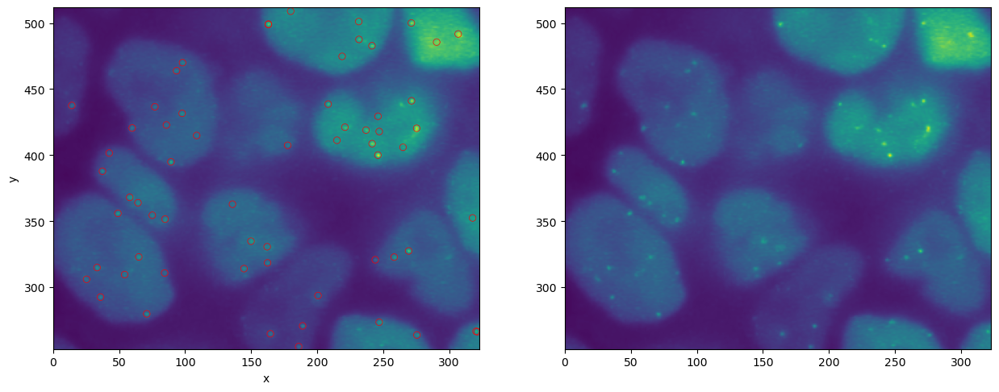

In [15]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(im_w2_max_p[frame])
sns.scatterplot(data=df_detection_teto,x='x',y='y',facecolors='none',edgecolor='red')
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.subplot(1,2,2)
plt.imshow(im_w2_max_p[frame])
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)

# Run Stardist on the DNA channel

In [11]:
labels = ut.predict_stardist(im_w2_max_p)

Found model '2D_versatile_fluo' for 'StarDist2D'.


2023-05-23 14:37:15.360422: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-23 14:37:15.371963: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
1/1 [==============================] - 0s 62ms/step


# Assign spot to a label

In [12]:
df_labs, labs = ut.filter_cells(labels)

In [13]:
df_detection_sororin,df_detection_sororin_in_cells = ut.assign_label_to_spot(labs,frame,df_detection_sororin)
df_detection_teto,df_detection_teto_in_cells = ut.assign_label_to_spot(labs,frame,df_detection_teto)

1263395182.py (7): The palette list has more values (35) than needed (20), which may not be intended.
1263395182.py (10): The palette list has more values (35) than needed (22), which may not be intended.


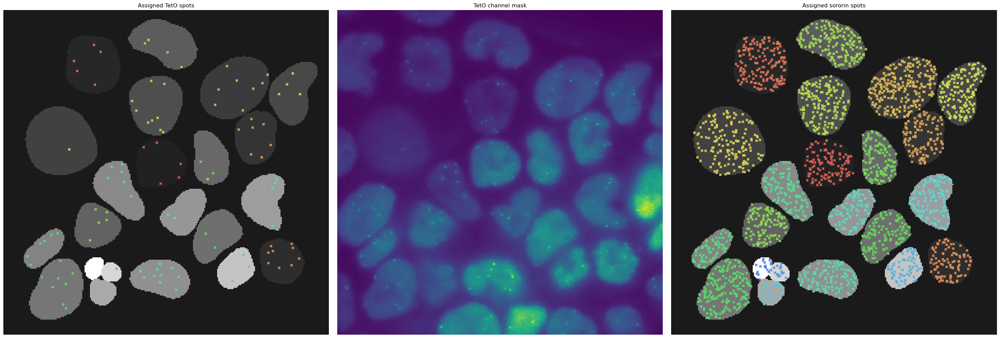

In [14]:
fig,ax = plt.subplots(1,3,figsize=(30,10))

cmap = sns.color_palette("hls", np.max(df_detection_sororin_in_cells.label.values))

ax[1].imshow(im_w2_max_p[frame],interpolation='nearest')

sns.scatterplot(data=df_detection_teto_in_cells,x='x',y='y',hue='label',palette=cmap,legend=False,marker='X',linewidth=0,zorder=1,ax=ax[0])
ax[0].imshow(labs[frame],alpha=0.9,interpolation='nearest',cmap='gray')

sns.scatterplot(data=df_detection_sororin_in_cells,x='x',y='y',hue='label',palette=cmap,legend=False,marker='X',linewidth=0,zorder=1,ax=ax[2])
ax[2].imshow(labs[frame],alpha=0.9,interpolation='nearest',cmap='gray')

title = ['Assigned TetO spots' ,'TetO channel mask','Assigned sororin spots']

for l,a in enumerate(ax):
    a.set_title(title[l])
    a.axis('off')

plt.tight_layout()
# plt.savefig('plots/spots_assignments_in_cells.png',dpi=300)


# Filter cells based on size

In [20]:
from skimage.segmentation import clear_border

In [21]:
def filter_cells(labels:np.array,thresh_eccentricity:float = 0.8)-> tuple:
    """Function to filter labeled cells

    Args:
        labels (np.array): labeled image
        thresh_eccentricity (float, optional): the threshold on the eccentricity to filter cells (the close they are to 1 the less round they are ). Defaults to 0.8.

    Returns:
        tuple: the coordinates of the filltered cells and the corresponding labeled images
    """

    #clear the cells that touch border

    labels_cleared = np.asarray([clear_border(labels[frame, ...]) for frame in range(labels.shape[0])]) #labels not touching the border

    #compute region props of the labels computed above 

    dfs = []
    for frame in range(len(labels_cleared)):
        df = pd.DataFrame(
            regionprops_table(labels_cleared[frame], properties=["label", "centroid",'area','bbox','eccentricity'])
        )
        df["frame"] = frame
        dfs.append(df)
    coordinate_df_cleared = pd.concat(dfs)

    # filter based on eccentricity (and size ?)
    coordinate_df_cleared = coordinate_df_cleared.query(f'eccentricity < {thresh_eccentricity}') #filter the eccentricity

    return coordinate_df_cleared,labels_cleared

In [22]:
labels_cleared = np.asarray([clear_border(labels[frame, ...]) for frame in range(labels.shape[0])]) #labels not touching the border

In [23]:
dfs = []
for frame in range(len(labels_cleared)):
    df = pd.DataFrame(
        regionprops_table(labels_cleared[frame], properties=["label", "centroid",'area','bbox','eccentricity'])
    )
    df["frame"] = frame
    dfs.append(df)
coordinate_df_cleared = pd.concat(dfs)

In [24]:
thresh_eccentricity = 0.8
coordinate_df_cleared = coordinate_df_cleared.query(f'eccentricity < {thresh_eccentricity}') #filter the eccentricity

# Track the spots (Tet and sororin) in time 

In [32]:
frame = 100

In [16]:
# segment frame + 1
df_detection_sororin_2 = ut.hmax_3D(raw_im=im_w1,frame=frame+1,sd=sd_sororin)
df_detection_teto_2 = ut.hmax_3D(raw_im=im_w2,frame=frame+1,sd=sd_teto,n=9,thresh=0.25)

In [17]:
lab_so_2 = [labels[frame,int(i.y),int(i.x)] for i in df_detection_sororin_2.iloc]
lab_tet_2 = [labels[frame,int(i.y),int(i.x)] for i in df_detection_teto_2.iloc]

df_detection_sororin_2['label'] = lab_so_2
df_detection_teto_2['label'] = lab_tet_2

df_detection_tet_2 = df_detection_teto_2[df_detection_teto_2.label != 0]  # get only the tet spots that are in the cells (should be all of them... )
df_detection_sororin_in_cell_2 = df_detection_sororin_2[df_detection_sororin_2.label != 0]  # get only the spots that are in the cells

In [19]:
comb_so = pd.concat([df_detection_sororin_in_cells,df_detection_sororin_in_cell_2])
comb_tet = pd.concat([df_detection_teto,df_detection_tet_2])

track_sororin,matched_sororin = ut.track(comb_so,track_cost_cutoff=1.5,gap_closing_cost_cutoff=5.0,gap_closing_max_frame_count=4)
track_tet,matched_tet = ut.track(comb_tet,track_cost_cutoff=1.5,gap_closing_cost_cutoff=5.0,gap_closing_max_frame_count=4)

In [20]:
print('Single particle channel')
print(f'Number of spots detected: {len(df_detection_sororin)}\nNumber of spots in cells: {len(df_detection_sororin_in_cells)}\nNumber of spots matched between 2 frames: {len(matched_sororin[matched_sororin.frame == 0])}')

Single particle channel
Number of spots detected: 4671
Number of spots in cells: 2624
Number of spots matched between 2 frames: 1961


In [21]:
print('DNA channel')
print(f'Number of spots detected: {len(df_detection_teto)}\nNumber of spots in cells: {len(df_detection_teto_in_cells)}\nNumber of spots matched between 2 frames: {len(matched_tet[matched_tet.frame == 0])}')

DNA channel
Number of spots detected: 146
Number of spots in cells: 104
Number of spots matched between 2 frames: 99


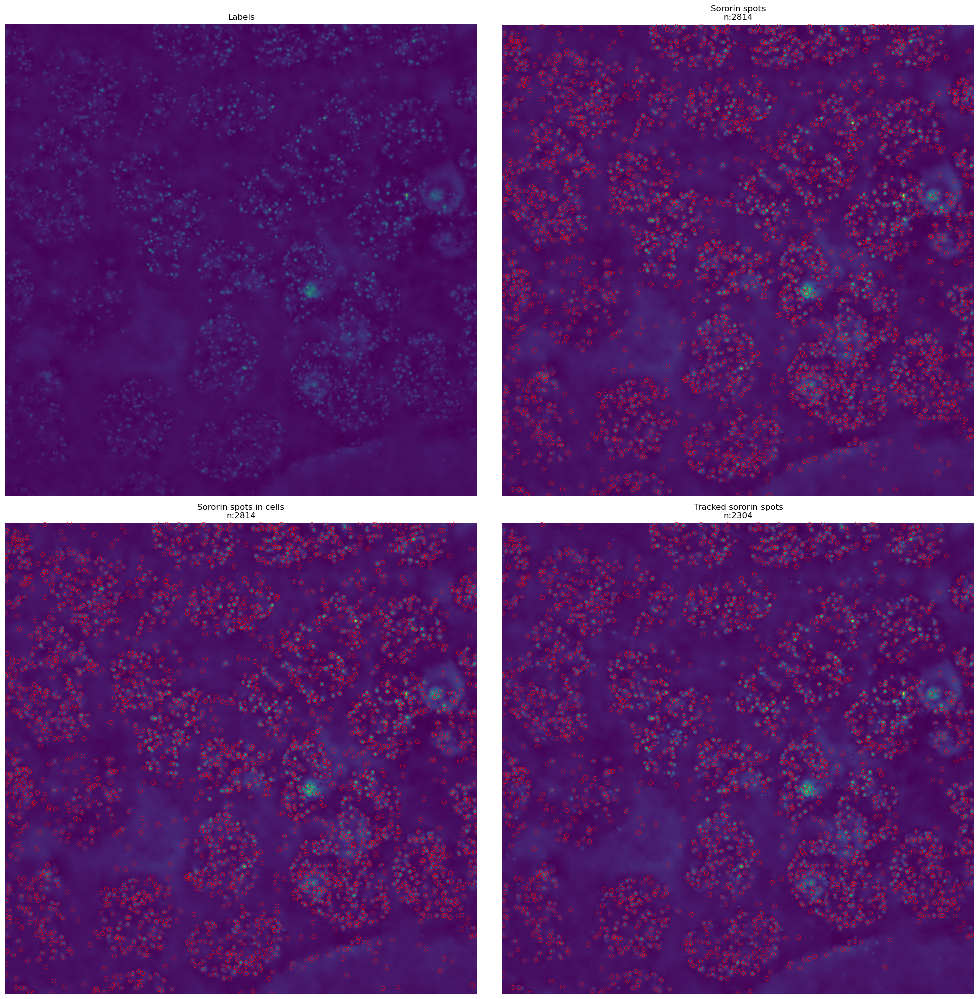

In [37]:
fig,ax = plt.subplots(2,2,figsize=(20,20))
ax = ax.ravel()

title = ['Labels',f'Sororin spots\nn:{len(df_detection_sororin)}',f'Sororin spots in cells\nn:{len(df_detection_sororin_in_cells)}',f'Tracked sororin spots\nn:{len(matched_sororin[matched_sororin.frame == 0])}']
dfs = [pd.DataFrame(columns=['x','y']),df_detection_sororin,df_detection_sororin_in_cells,matched_sororin[matched_sororin.frame == 0]]

for df,(l,a) in zip(dfs,enumerate(ax)):
    if l == 0:
        a.imshow(labels[frame],origin='lower',interpolation='nearest')
        a.imshow(im_w1_sd_p[frame],origin='lower',alpha=0.7)
        a.axis('off')
        a.set_title(title[l])
    else:
        a.imshow(im_w1_sd_p[frame])
        sns.scatterplot(data=df,x='x',y='y',edgecolor='red',facecolors='none',ax=a)
        a.set_title(title[l])
        a.axis('off')
        a.set_xlim(0,np.shape(im_w1_sd_p)[1])
        a.set_ylim(0,np.shape(im_w1_sd_p)[2])

plt.tight_layout()
# plt.savefig('plots/tracking_assignment.png',dpi=300)

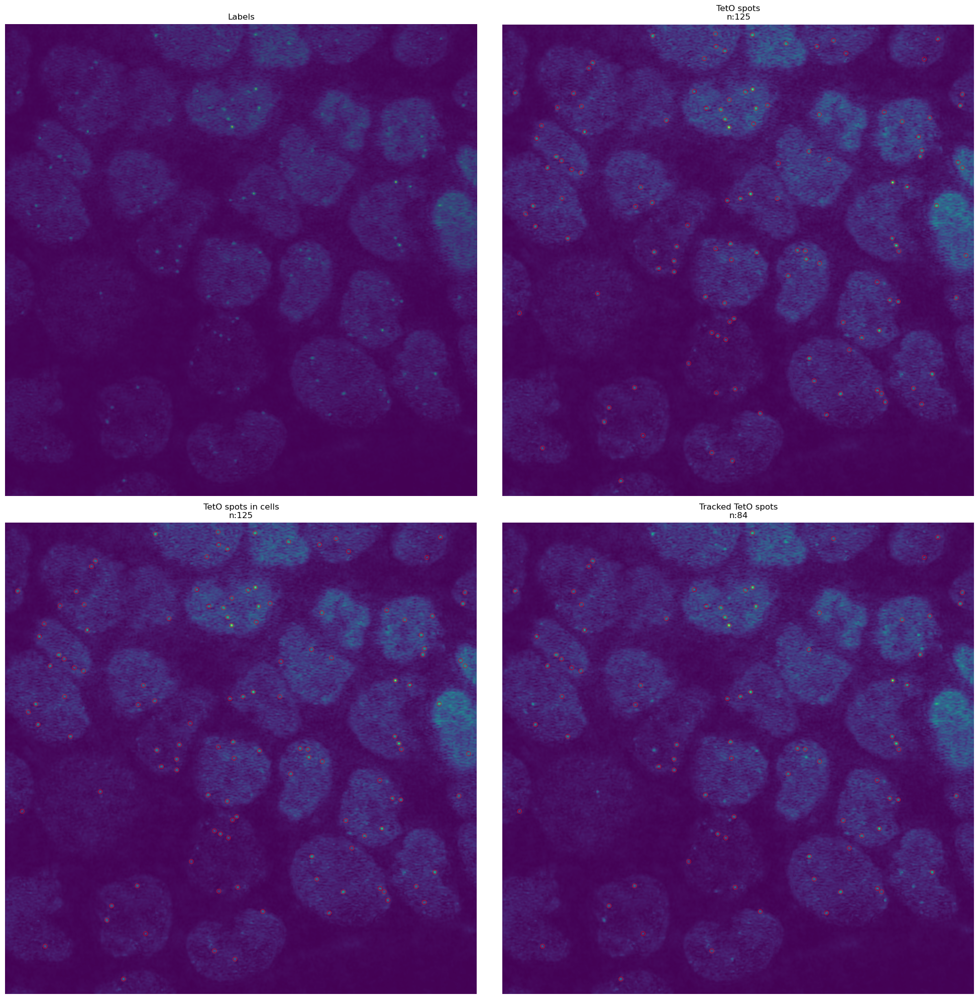

In [38]:
fig,ax = plt.subplots(2,2,figsize=(20,20))
ax = ax.ravel()

title = ['Labels',f'TetO spots\nn:{len(df_detection_teto)}',f'TetO spots in cells\nn:{len(df_detection_teto_in_cells)}',f'Tracked TetO spots\nn:{len(matched_tet[matched_tet.frame == 0])}']
dfs = [pd.DataFrame(columns=['x','y']),df_detection_teto,df_detection_teto_in_cells,matched_tet[matched_tet.frame == 0]]

for df,(l,a) in zip(dfs,enumerate(ax)):
    if l == 0:
        a.imshow(labels[frame],origin='lower',interpolation='nearest')
        a.imshow(im_w2_sd_p[frame],origin='lower',alpha=0.7)
        a.axis('off')
        a.set_title(title[l])
    else:
        a.imshow(im_w2_sd_p[frame])
        sns.scatterplot(data=df,x='x',y='y',edgecolor='red',facecolors='none',ax=a)
        a.set_title(title[l])
        a.axis('off')
        a.set_xlim(0,np.shape(im_w1_sd_p)[1])
        a.set_ylim(0,np.shape(im_w1_sd_p)[2])

plt.tight_layout()
# plt.savefig('plots/tracking_assignment_tet.png',dpi=300)

## Test to make the fitting/segmentation faster

In [9]:
from functools import partial

In [13]:
frame = 100

In [100]:
im_mask = extrema.h_maxima(im_w2_sd_p[frame],2*int(sd_s[0]))

# extract the points and fit gaussian

y,x = np.nonzero(im_mask)  # coordinates of every ones

x_s = []
y_s = []
sdx_fit = []
sdy_fit = []

partial_fit = partial(gauss_single_spot,im_w1_sd_p[frame])

# print(list(map(partial_fit,y,x)))
 

# # for i,j in zip (x,y):
# #     y0,x0,sd_x,sd_y = gauss_single_spot(raw_im[frame],r_coord=j,c_coord=i)
# #     x_s.append(x0)
# #     y_s.append(y0)
# #     sdx_fit.append(sd_x)
# #     sdy_fit.append(sd_y)
    
# # create a dataframe with sub pixel localization

# df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
# df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
# df_loc['frame'] = [frame] * len(df_loc)
# df_loc

# # filter the dataframe based on the gaussian fit

# df_loc_filtered = df_loc.query(f'sd_fit_x <{0.5} and sd_fit_y <{0.5}') #remove the bad fit 
# df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
# df_loc_filtered


In [26]:
list(map(gauss_single_spot,[im_w2_sd_p[frame]]*len(x),y,x))

[(26.86024464464492,
  2.636523461286515,
  0.15548446477289724,
  0.11474655829078455),
 (58.794266118228336,
  1.269392462932363,
  0.3303616534101242,
  0.6330330079579338),
 (103.13386685753004,
  2.3711924550986043,
  0.41623722173337063,
  0.6669896112635851),
 (112.50014794675464,
  1.126815916491475,
  0.22433529295225588,
  0.23078950773748028),
 (168.24503620576974,
  3.9999999999999996,
  1.7142767745381728,
  0.6332692867086271),
 (184.99999999999997, 3.8428809018828662, 9.21090242290616, 9.788727637197658),
 (214.08373584370383,
  3.9999999999999996,
  1.5050193729480694,
  0.9736211964759538),
 (310.5612180990567, 3.9182349906725427, 0.977642087588019, 0.273214330659662),
 (350.39100951241574,
  3.999999999999998,
  0.4389038518392161,
  0.14807708404088882),
 (371.722839035438,
  0.711784428281372,
  0.19930152338595808,
  0.19774544548828024),
 (10.046538020737781,
  1.0107079376327014e-12,
  2.062802266718735,
  2.116032364699247),
 (128.0, 1.6868559224147157, 0.227869

In [41]:
[partial_fit(i,j) for i,j in zip(x,y)]

[(1.726601129243112e-14,
  29.9949139959221,
  5.531569951687824,
  3.4942618012859192),
 (0.8642215534480923,
  57.86779257114623,
  0.5012480992643252,
  0.6078004521943925),
 (5.4448590013016734e-15,
  102.83347982312422,
  0.850773614847443,
  0.9363616326891258),
 (3.546639133202282e-17,
  112.05982741207518,
  0.27910845533976997,
  0.49442694929190223),
 (0.328519382221117,
  167.16324811412352,
  0.17992684864668435,
  0.3080108255514036),
 (0.22025035323719833,
  183.0107677849493,
  0.14468203707371302,
  0.22648722766249735),
 (0.7431529683923149, 215.0, 6.8597067183632054, 2.5559492089108686),
 (3.4588208504268443e-15,
  311.7376684291397,
  0.647649155972101,
  0.7530212898127363),
 (1.0972089614318373e-13,
  353.7984743870812,
  11.67693168866299,
  7.935239606265103),
 (0.26347414988822043,
  373.3688834982329,
  0.2666425481730674,
  0.33406004499990155),
 (0.13542411708892999,
  9.085163523988488,
  0.2675383115187157,
  0.437066582619026),
 (0.04930253247480371,
  130

In [42]:
%%prun
[partial_fit(i,j) for i,j in zip(x,y)]

          51345526 function calls (50128006 primitive calls) in 104.103 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
   837352   12.456    0.000   12.456    0.000 utils.py:16(gauss_2d)
     7505    6.880    0.001   97.367    0.013 trf.py:205(trf_bounds)
6381049/5163529    6.711    0.000   30.078    0.000 {built-in method numpy.core._multiarray_umath.implement_array_function}
   138670    5.405    0.000    9.754    0.000 _decomp_svd.py:13(svd)
  1222787    4.635    0.000    4.635    0.000 {method 'reduce' of 'numpy.ufunc' objects}
   138685    4.591    0.000    7.328    0.000 _numdiff.py:11(_adjust_scheme_to_bounds)
  1020043    4.176    0.000    7.798    0.000 linalg.py:2357(norm)
   138685    4.125    0.000   20.886    0.000 _numdiff.py:566(_dense_difference)
   837352    3.162    0.000   15.618    0.000 _minpack_py.py:484(func_wrapped)
   146192    2.844    0.000    5.582    0.000 common.py:467(CL_scaling_vector)
  154

In [7]:
from multiprocessing import Pool

In [8]:
import scipy.optimize as opt

In [97]:
k = [(x[i],y[i]) for i in range(len(x))]

In [99]:
k

[(28, 0),
 (58, 0),
 (102, 0),
 (112, 0),
 (168, 0),
 (183, 0),
 (213, 0),
 (311, 0),
 (352, 0),
 (373, 0),
 (9, 1),
 (130, 1),
 (173, 1),
 (192, 1),
 (325, 1),
 (459, 1),
 (144, 2),
 (162, 2),
 (13, 3),
 (21, 3),
 (134, 3),
 (152, 3),
 (250, 3),
 (271, 3),
 (307, 3),
 (83, 4),
 (121, 4),
 (170, 4),
 (39, 5),
 (123, 5),
 (159, 5),
 (173, 5),
 (181, 5),
 (321, 5),
 (17, 6),
 (279, 6),
 (109, 7),
 (151, 7),
 (166, 7),
 (136, 8),
 (143, 8),
 (163, 8),
 (176, 8),
 (375, 8),
 (509, 8),
 (37, 9),
 (64, 9),
 (105, 9),
 (128, 9),
 (120, 10),
 (139, 10),
 (19, 11),
 (113, 11),
 (136, 11),
 (143, 11),
 (154, 11),
 (175, 11),
 (193, 11),
 (226, 11),
 (246, 11),
 (165, 12),
 (312, 12),
 (397, 12),
 (31, 13),
 (118, 13),
 (145, 13),
 (211, 13),
 (266, 13),
 (340, 13),
 (13, 14),
 (157, 14),
 (134, 15),
 (153, 15),
 (232, 15),
 (464, 15),
 (129, 16),
 (149, 16),
 (170, 16),
 (238, 16),
 (246, 16),
 (283, 16),
 (155, 17),
 (160, 17),
 (275, 17),
 (140, 18),
 (229, 18),
 (383, 18),
 (125, 19),
 (137, 

In [102]:
print(x[0],y[0])
with Pool() as p:
       x_s,y_s,sdx_fit,sdy_fit = zip(*(p.starmap(partial_fit,k)))

print(x_s)
print(y_s)
print(sdx_fit)
print(sdy_fit)

28 0
(1.046062238310186, 2.321481319150359, 2.693592249238874, 0.2726546767331552, 2.714001497731483, 3.584674270165127, 2.44378558569353, 3.9999999999999996, 0.786547059194538, 3.6602170108307766, 3.367813720325977, 4.520124490124877e-16, 2.1342107491756375, 1.5347364668814605, 3.9999999999999813, 0.9768791331025896, 3.9999999999999996, 3.9999999999999996, 3.3347629615315166, 5.0, 1.4474394749742905, 1.0000000000064346, 5.0, 2.453126985544959, 3.3366538166555535, 2.0, 4.02155303762852, 3.3298690686709502, 3.0, 6.999999999999996, 3.0518280416606687, 4.569336717886987, 5.016113397248353, 5.396048496890511, 6.092526068216357, 5.75866663725059, 5.0, 8.103728423873616, 5.0, 6.0, 6.613289201802898, 7.292833897669198, 6.000000000002116, 6.0, 10.0, 7.000000000000091, 7.000000000040817, 10.082217541857517, 8.727669510609777, 10.507808901764212, 8.69975220909382, 9.0, 10.004526043859881, 12.937714266466543, 11.610937727726473, 11.65538153959138, 10.93983179208153, 10.842221790649885, 9.00000000

In [82]:
print(x)
print(y)
x_s = []
y_s = []
sdx_fit = []
sdy_fit = []
for i,j in zip (x,y):
    y0,x0,sd_x,sd_y = gauss_single_spot(im_w1_sd_p[frame],r_coord=j,c_coord=i)
    x_s.append(x0)
    y_s.append(y0)
    sdx_fit.append(sd_x)
    sdy_fit.append(sd_y)

[ 28  58 102 ... 476 479 485]
[  0   0   0 ... 511 511 511]


In [103]:
print(x_s)
print(y_s)
print(sdx_fit)
print(sdy_fit)

(1.046062238310186, 2.321481319150359, 2.693592249238874, 0.2726546767331552, 2.714001497731483, 3.584674270165127, 2.44378558569353, 3.9999999999999996, 0.786547059194538, 3.6602170108307766, 3.367813720325977, 4.520124490124877e-16, 2.1342107491756375, 1.5347364668814605, 3.9999999999999813, 0.9768791331025896, 3.9999999999999996, 3.9999999999999996, 3.3347629615315166, 5.0, 1.4474394749742905, 1.0000000000064346, 5.0, 2.453126985544959, 3.3366538166555535, 2.0, 4.02155303762852, 3.3298690686709502, 3.0, 6.999999999999996, 3.0518280416606687, 4.569336717886987, 5.016113397248353, 5.396048496890511, 6.092526068216357, 5.75866663725059, 5.0, 8.103728423873616, 5.0, 6.0, 6.613289201802898, 7.292833897669198, 6.000000000002116, 6.0, 10.0, 7.000000000000091, 7.000000000040817, 10.082217541857517, 8.727669510609777, 10.507808901764212, 8.69975220909382, 9.0, 10.004526043859881, 12.937714266466543, 11.610937727726473, 11.65538153959138, 10.93983179208153, 10.842221790649885, 9.0000000000005

In [10]:
def hmax_detection_fast(raw_im:np.array,frame:int,sd:float,n:int = 2,thresh:float = 0.5) -> pd.DataFrame:
    """_summary_

    Args:
        raw_im (np.array): the raw image to segment
        frame (int): the frame to segment
        sd (float): the sd of the peak intensity (threshold of segmentation)
        n (int, optional): how much brighter than the sd of the whole image to threshold
        thresh (float, optional): threshold for the gaussian fitting filter. Filter on the standard deviation of the fit (based on the covariance of the parameters) Defaults to 0.5.

    Returns:
        pd.DataFrame: Dataframe of sub-pixel localizations of the detected spots
    """
    
    #detect the spots
    im_mask = extrema.h_maxima(raw_im[frame],n*int(sd))

    # extract the points and fit gaussian

    y,x = np.nonzero(im_mask)  # coordinates of every ones

    partial_fit = partial(gauss_single_spot,raw_im[frame])
    
    k = [(x[i],y[i]) for i in range(len(x))]

    with Pool(5) as p:
        x_s,y_s,sdx_fit,sdy_fit = zip(*(p.starmap(partial_fit,k)))
        
    # create a dataframe with sub pixel localization

    df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
    df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
    df_loc['frame'] = [frame] * len(df_loc)
    df_loc
    
    # filter the dataframe based on the gaussian fit

    df_loc_filtered = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
    df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
    df_loc_filtered

    return df_loc_filtered

In [105]:
df_detection_sororin_slow = hmax_detection(raw_im=im_w1_sd_p,frame=frame+1,sd=sd_sororin)

In [21]:
df_detection_sororin_fast = hmax_detection_fast(raw_im=im_w1_sd_p,frame=frame+1,sd=sd_sororin)

In [128]:
print(len(df_detection_sororin_slow),len(df_detection_sororin_fast))

2965 2965


# Try to do the fitting in 3D

In [17]:
import scipy.optimize as opt
def gauss_3d(xyz, amplitude, x0, y0, z0, sigma_xy, sigma_z, offset):
    """3D gaussian."""
    x, y, z = xyz
    x0 = float(x0)
    y0 = float(y0)
    z0 = float(z0)

    gauss = offset + amplitude * np.exp(
        -(
            ((x - x0) ** (2) / (2 * sigma_xy ** (2)))
            + ((y - y0) ** (2) / (2 * sigma_xy ** (2)))
            + ((z - z0) ** (2) / (2 * sigma_z ** (2)))
        )
    )
    return gauss

EPS = 1e-4

def find_start_end(coord, img_size, crop_size):
    start_dim = np.max([int(np.round(coord - crop_size // 2)), 0])
    if start_dim < img_size - crop_size:
        end_dim = start_dim + crop_size
    else:
        start_dim = img_size - crop_size
        end_dim = img_size

    return start_dim, end_dim


def gauss_single_spot_3D(
    image: np.ndarray,
    c_coord: float,
    r_coord: float,
    z_coord: float,
    crop_size: int = 4,
    crop_size_z: int = 5,
):
    """Gaussian prediction on a single crop centred on spot."""

    start_dim1, end_dim1 = find_start_end(c_coord, image.shape[1], crop_size)
    start_dim2, end_dim2 = find_start_end(r_coord, image.shape[2], crop_size)
    start_dim3, end_dim3 = find_start_end(z_coord, image.shape[0], crop_size_z)

    crop = image[start_dim3:end_dim3,start_dim1:end_dim1, start_dim2:end_dim2]

    x = np.arange(0, crop.shape[1], 1)
    y = np.arange(0, crop.shape[2], 1)
    z = np.arange(0, crop.shape[0], 1)
    xx, yy, zz = np.meshgrid(x, y, z)

    # Guess intial parameters
    x0 = int(crop.shape[1] // 2)  # Center of gaussian, middle of the crop
    y0 = int(crop.shape[2] // 2)  # Center of gaussian, middle of the crop
    z0 = int(crop.shape[0] // 2)  # Center of gaussian, middle of the crop
    sigma = max(*crop.shape[:-1]) * 0.1  # SD of gaussian, 10% of the crop
    sigmaz = crop.shape[-1] * 0.1  # SD of gaussian, 10% of the crop
    amplitude_max = max(
        np.max(crop) / 2, np.min(crop)
    )  # Height of gaussian, maximum value
    initial_guess = [amplitude_max, x0, y0, z0, sigma, sigmaz, 0]

    # Parameter search space bounds
    lower = [np.min(crop), 0, 0, 0, 0, 0, -np.inf]
    upper = [
        np.max(crop) + EPS,
        crop_size,
        crop_size,
        crop_size_z,
        np.inf,
        np.inf,
        np.inf,
    ]
    bounds = [lower, upper]
    try:
        popt, pcov = opt.curve_fit(
            gauss_3d,
            (xx.ravel(), yy.ravel(), zz.ravel()),
            crop.ravel(),
            p0=initial_guess,
            bounds=bounds,
        )
        sd = np.sqrt(np.diag(pcov))
    except RuntimeError:
        print('Runtime')
        return r_coord, c_coord, z_coord,0,0,0

    x0 = popt[1] + start_dim2
    y0 = popt[2] + start_dim1
    z0 = popt[3] + start_dim3
    sdx = sd[1]
    sdy = sd[2]
    sdz = sd[3]

    # If predicted spot is out of the border of the image
    if x0 >= image.shape[1] or y0 >= image.shape[2] or z0 >= image.shape[0]:
        return r_coord, c_coord, z_coord,0,0,0

    return x0, y0, z0,sdx,sdy,sdz


In [13]:
im_w1[frame].shape

(5, 512, 512)

In [13]:
im_mask = extrema.h_maxima(im_w1[frame],h=400)


In [14]:
z,y,x = np.nonzero(im_mask)

In [24]:
partial_fit = partial(gauss_single_spot_3D,im_w1[frame])

In [25]:
k = [(y[i],x[i],z[i]) for i in range(len(x))]

In [26]:
with Pool(5) as p:
       x_s,y_s,z_s,sdx_fit,sdy_fit,sdz_fit = zip(*(p.starmap(partial_fit,k)))

In [27]:
thresh = 0.5

df_loc = pd.DataFrame([x_s,y_s,z_s,sdx_fit,sdy_fit,sdz_fit]).T
df_loc.rename(columns={0:'x',1:'y',2:'z',3:'sd_fit_x',4:'sd_fit_y',5:'sd_fit_z'},inplace=True)
df_loc['frame'] = [frame] * len(df_loc)
df_loc

# filter the dataframe based on the gaussian fit

df_loc_filtered_3D = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
df_loc_filtered_3D = df_loc_filtered_3D[df_loc_filtered_3D.sd_fit_x.values != 0]    #remove the points that were not fitted
df_loc_filtered_3D

,x,y,z,sd_fit_x,sd_fit_y,sd_fit_z,frame
6,369.201631,18.000000,1.432278e-10,0.175719,0.416142,8.646920e+00,100
7,138.344507,20.000000,1.672377e-31,0.157232,0.392758,1.277412e+01,100
9,271.007246,20.000000,1.028965e-11,0.217451,0.433631,1.242117e+01,100
12,240.999136,27.000000,1.051024e-09,0.223004,0.447318,2.905909e+00,100
13,260.874423,32.000000,6.164370e-11,0.224300,0.406249,8.613888e+00,100
...,...,...,...,...,...,...,...
1726,434.951699,103.939726,5.000000e+00,0.377324,0.374065,4.576746e+06,100
1782,422.914944,142.372280,4.415772e-29,0.234961,0.194761,1.429855e+01,100
1809,271.311501,163.400060,5.000000e+00,0.184280,0.175783,4.757096e+01,100
2072,411.140077,375.574546,5.000000e+00,0.467465,0.328646,1.899079e+06,100


In [28]:
df_loc

,x,y,z,sd_fit_x,sd_fit_y,sd_fit_z,frame
0,180.497905,3.000000,1.721197e-23,0.417764,1.094658,6.184490,100
1,99.379313,4.000000,1.397698e-10,0.249147,0.646441,18.149421,100
2,150.000000,11.000000,3.679463e+00,19.453326,12.265758,7.349589,100
3,156.062395,15.000000,3.861641e-01,0.262337,0.558965,3.292349,100
4,237.122432,15.000000,3.797192e-25,0.250038,0.552346,15.608101,100
...,...,...,...,...,...,...,...
2241,246.000000,509.011046,5.000000e+00,5.551831,1.689357,16.942632,100
2242,216.734006,512.000000,5.000000e+00,0.773909,1.443975,6.172582,100
2243,368.104009,508.000000,4.279540e-32,1.956447,2.079248,12.337193,100
2244,459.000000,509.450587,5.000000e+00,6.935365,1.687644,9.568131,100


In [82]:
df_loc_filtered.z.values

array([1.37090288e+00, 3.99999998e+00, 5.17881394e-01, 1.88525899e+00,
       1.11393286e+00, 1.40675429e+00, 5.73039107e-01, 7.10069301e-01,
       1.94525528e+00, 1.23013350e-10, 2.24916483e-01, 5.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 3.38653272e+00])

# Detect in 3D and fit where the intensity is max in z

In [73]:
sd = compute_h_param(im=im_w1_max_p,frame=frame)

fromnumeric.py (3432): Mean of empty slice.
_methods.py (190): invalid value encountered in double_scalars


In [74]:
im_mask = extrema.h_maxima(im_w1[frame],h=sd)

utils.py (282): possible precision loss converting image to floating point. To silence this warning, ensure image and h have same data type.


In [75]:
z,y,x = np.nonzero(im_mask)

In [48]:
z_loc = [np.where(im_w1[frame,:,y[i],x[i]]==np.max(im_w1[frame,:,y[i],x[i]]))[0][0]  for i in range(len(x))]#find where the intensity is max in z at everz x y detected

In [76]:
k = [(im_w1[frame,j],x[i],y[i]) for (i,j) in zip(range(len(x)),z)]

In [28]:
x_s = []
y_s = []
sdx_fit = []
sdy_fit = []
for i,j,k in zip (x,y,z):
    y0,x0,sd_x,sd_y = gauss_single_spot(im_w1[frame,k,:,:],r_coord=j,c_coord=i)
    x_s.append(x0)
    y_s.append(y0)
    sdx_fit.append(sd_x)
    sdy_fit.append(sd_y)

In [77]:
with Pool(5) as p:
       x_s,y_s,sdx_fit,sdy_fit = zip(*(p.starmap(gauss_single_spot,k)))

In [51]:
thresh = 0.2

df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
df_loc['frame'] = [frame] * len(df_loc)
df_loc

# filter the dataframe based on the gaussian fit

df_loc_filtered = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
df_loc_filtered

,x,y,sd_fit_x,sd_fit_y,frame
26,2.628149,97.774311,0.141779,0.128851,100
29,5.216592,166.458856,0.097442,0.081259,100
30,4.809061,169.413988,0.070504,0.080506,100
32,4.790175,351.543156,0.069411,0.080133,100
34,5.596352,99.466270,0.104776,0.106867,100
...,...,...,...,...,...
5288,508.647955,403.734618,0.123606,0.116935,100
5289,509.714883,215.412583,0.113061,0.120336,100
5290,509.867642,303.193814,0.188868,0.149871,100
5291,509.914472,369.954300,0.131646,0.128027,100


In [78]:
thresh = 0.5

df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
df_loc['frame'] = [frame] * len(df_loc)
df_loc

# filter the dataframe based on the gaussian fit

df_loc_filtered = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
df_loc_filtered

,x,y,sd_fit_x,sd_fit_y,frame
0,9.474353e-20,50.616635,0.353392,0.450693,100
1,1.928986e-01,272.654919,0.252010,0.278343,100
2,4.961161e+00,181.331332,0.228041,0.174644,100
3,5.596352e+00,99.466270,0.104776,0.106867,100
4,1.069077e+01,86.840526,0.434566,0.394645,100
...,...,...,...,...,...
3316,5.086480e+02,403.734618,0.123606,0.116935,100
3317,5.097149e+02,215.412583,0.113061,0.120336,100
3318,5.098676e+02,303.193814,0.188868,0.149871,100
3319,5.099145e+02,369.954300,0.131646,0.128027,100


In [63]:
df_detection_sororin_fast = hmax_detection_fast(raw_im=im_w1_sd_p,frame=frame,sd=sd_sororin)

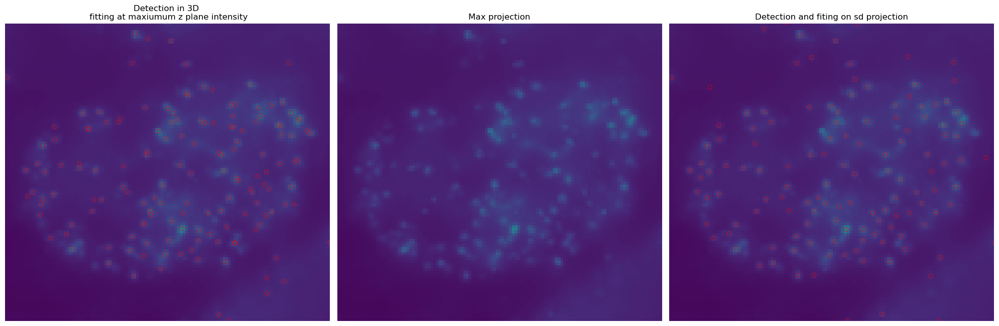

In [95]:
fig,ax = plt.subplots(1,3,figsize=(20,10))

title = ['Detection in 3D \n fitting at maxiumum z plane intensity','Max projection','Detection and fiting on sd projection']
for l,a in enumerate(ax):
    a.imshow(im_w1_max_p[frame])
    a.set_ylim(0,110)
    a.set_xlim(190,310)
    a.axis('off')
    a.set_title(title[l])


sns.scatterplot(data=df_loc_filtered,x='y',y='x',edgecolor='red',facecolors='none',ax = ax[0])

sns.scatterplot(data=df_detection_sororin_fast,x='y',y='x',edgecolor='red',facecolors='none',ax = ax[2])

plt.tight_layout()
# plt.savefig('plots/detection_in_3D.png',dpi=300)

In [80]:
print(len(df_detection_sororin_fast),len(df_loc_filtered))

2814 3093


In [20]:
# write the descritption of the function

def hmax_3D(raw_im: np.ndarray,frame: int,sd: float,thresh: float,n:int) -> pd.DataFrame:
    """_summary_

    Args:
        raw_im (np.ndarray): 
        frame (int): _description_
        sd (float): _description_
        thresh (float): _description_

    Returns:
        pd.DataFrame: _description_
    """
    
    im_mask = extrema.h_maxima(raw_im[frame],h=n*int(sd))

    z,y,x = np.nonzero(im_mask)

    k = [(raw_im[frame,j],x[i],y[i]) for (i,j) in zip(range(len(x)),z)]

    with Pool(5) as p:
       x_s,y_s,sdx_fit,sdy_fit = zip(*(p.starmap(gauss_single_spot,k)))

    df_loc = pd.DataFrame([x_s,y_s,sdx_fit,sdy_fit]).T
    df_loc.rename(columns={0:'x',1:'y',2:'sd_fit_x',3:'sd_fit_y'},inplace=True)
    df_loc['frame'] = [frame] * len(df_loc)
    df_loc

    # filter the dataframe based on the gaussian fit

    df_loc_filtered = df_loc.query(f'sd_fit_x <{thresh} and sd_fit_y <{thresh}') #remove the bad fit 
    df_loc_filtered = df_loc_filtered[df_loc_filtered.sd_fit_x.values != 0]    #remove the points that were not fitted
    
    return df_loc_filtered
    

# Detect the spots in the 3D image on the DNA channel

In [23]:
# detect the spots in the 3D image on the dna channel and fit them with a 3D gaussian

frame = 0

# print('Computing the h parameter')
# sd = compute_h_param(im=im_w2_max_p,frame=frame,thresh= 0.9)

print('Detecting the spots')
df_detection_dna = hmax_3D(raw_im=im_w2,frame=frame,sd=sd,thresh=0.5,n=4)

df_detection_dna



Detecting the spots


,x,y,sd_fit_x,sd_fit_y,frame
0,73.344510,270.123483,0.268636,0.312589,0
1,102.601682,392.774261,0.100056,0.093521,0
3,324.607679,149.984061,0.070418,0.067232,0
4,427.388382,2.228135,0.035437,0.037992,0
5,3.772831,149.770426,0.130747,0.130951,0
...,...,...,...,...,...
286,500.609045,199.894536,0.247343,0.207412,0
287,500.835380,360.876723,0.076141,0.074625,0
288,501.134473,374.911273,0.350706,0.412186,0
289,503.771100,298.957458,0.146654,0.128892,0


262


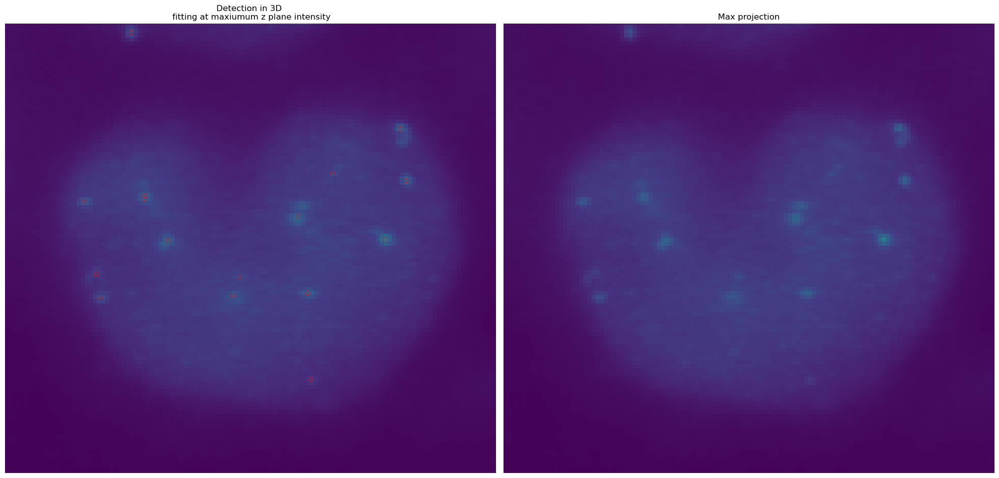

In [24]:
# display the detection on the max projection

fig,ax = plt.subplots(1,2,figsize=(20,10))

title = ['Detection in 3D \n fitting at maxiumum z plane intensity','Max projection']
for l,a in enumerate(ax):
    a.imshow(im_w2_max_p[frame])
    a.set_ylim(0,110)
    a.set_xlim(190,310)
    a.axis('off')
    a.set_title(title[l])

sns.scatterplot(data=df_detection_dna,x='y',y='x',edgecolor='red',facecolors='none',ax = ax[0])
# sns.scatterplot(data=df_detection_dna,x='y',y='x',edgecolor='red',facecolors='none',ax = ax[1])

plt.tight_layout()
# plt.savefig('plots/detection_in_3D.png',dpi=300)

print(len(df_detection_dna))

In [17]:
sd = compute_h_param(im=im_w2_max_p,frame=frame,thresh= 0.9)
sd

327.0960603388552